# **Starbucks Location Analysis**

## 1. Introduction
Walking down the streets in Manhattan, New York, aside from the fast-paced pedestrians and action-film-skill-level yellow cabs, Starbucks stores are probably the most often seen objects. As the largest coffee chain in the United States, it isn't only famous for its controversially delicious beverages, but as well for its stores location strategy. The question of "why does Starbucks choose a certain location" is a common business problem for it provides valuable insight into location selection strategy for its competitors as well as entrepreneurs seeking to open a store within an even remotely related industry.

This project aims to dig into the location selection of Starbucks, from a micro perspective, using Manhattan as research soil. To be more specific, we study all Starbucks locations in five boroughs of New York and try to figure out the similarities among these locations based on the venues within those locations' proximity. We will use Foursquare API to retrieve location data, define a "Starbucks proximity score" for a given location, and implement machine learning techniques to score any given location. The score will provide guidance for new Starbucks store location selection, but more importantly, for aspiring individual investors to open similar stores, for example, a fast food store or a tea house.

Data and analysis method used in the project will be discussed in more detail in the Data section.


## 2. Data Preparation and Pre-Processing

### 2.1 Importing necessary libraries

In [1206]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt


# map rendering library
import folium 
from numpy.random import shuffle


import geopy.distance
from geopy.extra.rate_limiter import RateLimiter

# Import necessary libraries for determining if a point lies wihtin a polygon
from shapely.geometry import MultiPoint, Point, Polygon,shape
from shapely.geometry.polygon import Polygon


from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.decomposition import SparsePCA
from sklearn import metrics
from sklearn.neural_network import MLPClassifier
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import MinMaxScaler


from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

print('Libraries imported.')

Libraries imported.


###  2.2 Working with [NYC Census Data ](https://data.cityofnewyork.us/City-Government/2010-Census-Tracts/fxpq-c8ku/).

Our data processing includes dividing up the targeted area, i.e. the five boroughs of New York City, into small fractions. The census tracts used by City Government is perfect for this.

In [248]:
nyct2010 = pd.read_csv('../data/nyct2010.csv')
nyct2010.head()
# Shape_Area is in SQUARE FEET
# Shape_Leng is the CIRCUMFERENCE in SQFT

,the_geom,CTLabel,BoroName,BoroCode,CT2010,BoroCT2010,CDEligibil,NTACode,NTAName,PUMA,Shape_Leng,Shape_Area
0,MULTIPOLYGON (((-74.07920577013245 40.64343078...,9.0,Staten Island,5,900,5000900,E,SI22,West New Brighton-New Brighton-St. George,3903,7729.016794,2.497010e+06
1,MULTIPOLYGON (((-73.96432543478758 40.75638153...,98.0,Manhattan,1,9800,1009800,I,MN19,Turtle Bay-East Midtown,3808,5534.199811,1.906016e+06
2,MULTIPOLYGON (((-73.96802436915851 40.75957814...,100.0,Manhattan,1,10000,1010000,I,MN19,Turtle Bay-East Midtown,3808,5692.168737,1.860938e+06
3,MULTIPOLYGON (((-73.97124277307127 40.76093641...,102.0,Manhattan,1,10200,1010200,I,MN17,Midtown-Midtown South,3807,5687.802439,1.860993e+06
4,MULTIPOLYGON (((-73.97445730550224 40.76229308...,104.0,Manhattan,1,10400,1010400,I,MN17,Midtown-Midtown South,3807,5693.036367,1.864600e+06


After loading in the data and take a first look, we see that each observation is a tract, and what we need is "the_geom" column, which contains coordinates for the vertices of each polygon that traces the tract.

We take the column and cleaning it up to form a dataframe containing all these coordinates

In [362]:
# Pull out all tracts
the_geom_t = nyct2010['the_geom']
the_geom_t.shape

the_geom_t = the_geom_t.str.replace("MULTIPOLYGON","")
the_geom_t = the_geom_t.str.replace("\(","")
the_geom_t = the_geom_t.str.replace("\)","")

tract_coords = the_geom_t.str.split(" |,",expand = True).add_prefix("column_")
tract_coords = tract_coords.replace("",np.nan)
tract_coords = tract_coords.replace("None",np.nan)
tract_coords = tract_coords.astype("float")

tract_coords.reset_index(inplace = True,drop = True)
tract_coords = tract_coords.dropna(axis=1, how='all')
print(tract_coords.shape)


(2165, 22984)


Save the dataset to a csv for convenience.

In [458]:
tract_coords.to_csv('../data/tract_coords.csv')

In [ ]:
#tract_coords= pd.read_csv('../data/tract_coords.csv',index_col = 0)

### 2.3 Potential Testing Locations
The process for opening a coffee shop/restaurant starts with collecting a pool of candidate locations. Normally you would pick whichever best location available instead of finding a perfect location and then search for an available space within, as most likely there wouldn't be any. So we quickly searched through *Loopnet.com*, which is the go-to website for commercial property search, and found ourselves the following available spaces. Of course this project aims to provide insights *only* from the location point of view, so the reason why these locations are selected is irrelevant. As a matter of fact, for demonstration purposes, we might as well generate random coordinates on the map and work with that, but we believe actual locations serve the purpose better.

In the modeling process, these test locations, or rather, the tracts containing them will be seperated from the data as the independent test set. We will also split up the remaining data into training set and validation set to improve model performance

In [1051]:
# read in the file prepared beforehand
test_locations = pd.read_csv('../data/test_locations.csv')
# add a column for later determining which tract each location is in.
test_locations['BoroCT2010'] = 0

Now take a look at what the data looks like, and we'll later search through the tracts to determine which tract each location belongs to.

In [1608]:
test_locations

,url,latitude,longitude,address,BoroCT2010
0,https://www.loopnet.com/Listing/155-Chambers-S...,40.716179,-74.010026,"155 Chambers St, New York, NY 10007",1002100
1,https://www.loopnet.com/Listing/115-E-57th-St-...,40.761498,-73.969877,"115 E 57th St, New York, NY 10022",1011203
2,https://www.loopnet.com/Listing/277-279-Bedfor...,40.714229,-73.961280,"277-279 Bedford Ave, Brooklyn, NY 11211",3055100
3,https://www.loopnet.com/Listing/671-677-Nostra...,40.674136,-73.950004,"671-677 Nostrand Ave, Brooklyn, NY 11216",3031701
4,https://www.loopnet.com/Listing/99-Allen-St-Ne...,40.718923,-73.990958,"99 Allen St, New York, NY 10002",1001800
5,https://www.loopnet.com/Listing/80-02-Roosevel...,40.747227,-73.885566,"80-02 Roosevelt Ave, Jackson Heights, NY 11372",4026901
6,https://www.loopnet.com/Listing/13617-39th-Ave...,40.760582,-73.829801,"13617 39th Ave, Flushing, NY 11354",4087100
7,https://www.loopnet.com/Listing/1140-Webster-A...,40.830055,-73.910502,"1140 Webster Ave, Bronx, NY 10456",2014300


### 2.3 Foursquare API -- Starbucks Locations
We will use Foursquare API to extract location data. The data needed consists of several parts. First we use the search function to get all Starbucks locations wihin New York City, and for each tract, determine how many Starbucks are in it. This will be the target value (y-values) of our data. Then we use explore function to get all venues within a certain distance of each tract. These venues data is used to form the features of our data (X-values).

First enter the Foursquare credentials

In [1607]:
CLIENT_ID = 'xxx' # your Foursquare ID
CLIENT_SECRET = 'xxx' # your Foursquare Secret
VERSION = '20200809' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: xxx
CLIENT_SECRET:xxx


The following function uses Foursquare API to search venues with a specific keyword, within a certain radius of a given location.

In [414]:
def searchNearbyVenues(number, keyword, latitudes, longitudes, radius=500,limit = 50):
    venues_list=[]
    i = 0
    for num,lat, lng in zip(number, latitudes, longitudes):
        i= i+1
        print(i)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&query={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius,
            limit,
            keyword)
            
        # make the GET request
        default = 'NaN'
        results = requests.get(url).json()["response"]['venues']
        # return only relevant information for each nearby venue
        venues_list.append([(
            num,
            v['name'], 
            v['location'].get('postalCode',default),
            v['location'].get('lat',default), 
            v['location'].get('lng',default), 
            v['categories'][0]['name']) for v in results])
        
        
    venues_result = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    venues_result.columns = [
                  'Number',
                  'Venue', 
                  'Venue Postal Code',
                  'Venue Latitude', 
                  'Venue Longitude',
                  'Venue Category']
    
    return(venues_result)

In order for the Starbucks locations obtained to be as inclusive as possible, we go through the following process to break down our search into many mini-searches, and then combine the results together to form the whole picture.

And more specifically:
1. We take advantage of the data we already have, i.e. the census tract data, which has tons of coordinates, and obtain all of them;
2. With some rudimentary counting, we realized that the number of coordinates are too large to be fed into Foursqure API to perform a point by point search--Foursquare APIs are bound by a 5,000 hourly calls and 99,500 daily calls, yet all location points within the tracts dataset is around 167K (As shown below). In addition, since these coordinates are to define the boundaries of tracts, a large amount of them are extremely close to each other, resulting in high redundancy for our use case. For these reasons, we do the following:
    
    - Round all coordinates to their 3rd decimals and remove duplicate values. This way we remove location points that are too close to each other to make significant difference while maintaining necessary accuracy, as keeping only 2 decimal would not suffice;
    - The resulting dataset (~26K) is still too large for the 5,000 hourly call limit, so we perform the searches step by step. We do 10 iterations, during each randomly picking 300 coordinates to perform a search. So in total we have 3,000 search points, which is adequate for the purpose of retrieving all Starbucks locations

In [369]:
all_coords = tract_coords.values.flatten()
all_coords = all_coords[~np.isnan(all_coords)]
all_coords = np.reshape(all_coords,(-1,2))
all_coords[:,[0,1]] = all_coords[:,[1,0]]
all_coords

array([[ 40.64343078, -74.07920577],
       [ 40.6433379 , -74.07913505],
       [ 40.64211482, -74.07819774],
       ...,
       [ 40.51945934, -74.2294879 ],
       [ 40.51944849, -74.22955367],
       [ 40.51908398, -74.22948214]])

In [462]:
all_coords.shape

(166901, 2)

In [416]:
all_coords_r3 = np.round(all_coords, 3)
all_coords_r3 = np.unique(all_coords_r3, axis = 0)
all_coords_r3.shape

all_starbucks_dict = dict()
for i in range(10):
    
    shuffle(all_coords_r3)
    random_coords_r3 = all_coords_r3[:300]
    all_starbucks_dict[i] = searchNearbyVenues(number = np.arange(0,300),
                            keyword = 'Starbucks',
                           latitudes=random_coords_r3[:,0],
                           longitudes=random_coords_r3[:,1],
                            radius = 500,
                            limit = 100)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142


In [432]:
all_starbucks = pd.concat([
    all_starbucks_dict[0],
    all_starbucks_dict[1],
    all_starbucks_dict[2],
    all_starbucks_dict[3],
    all_starbucks_dict[4],
    all_starbucks_dict[5],
    all_starbucks_dict[6],
    all_starbucks_dict[7],
    all_starbucks_dict[8],
    all_starbucks_dict[9]
])

The following steps are data cleaning, which may seem a bit trivial, yet we need to make sure all Starbucks locations we got are:
1. In fact, Starbucks locations;
    - Here we include only locations with "starbucks" keyword in their venue name;
2. Locate within New York City, due to borderline possibilities;
    - Keep locations only with postal codes in NYC, before which we need to fill in a few locations' missing postal code;
3. Unique locations, since the nature of our search method leads to unavoidable overlapping;
    - Remove duplicate values;
4. At last, overall comprehensive and processable.
    - Cleaning up and visualization

In [437]:
# Take a look 
all_starbucks[all_starbucks['Venue Postal Code']=='NaN']
all_starbucks.head()

,Number,Venue,Venue Postal Code,Venue Latitude,Venue Longitude,Venue Category
9,26,starbucks,NaN,40.704639,-73.816826,Coffee Shop
43,57,Starbucks,NaN,40.751879,-73.990765,Coffee Shop
44,57,Starbucks Coffee Cart @ HSBC T3,NaN,40.751862,-73.982329,Coffee Shop
46,57,Monty's Starbucks,NaN,40.748106,-73.985364,Coffee Shop
50,62,Starbucks,NaN,40.888920,-73.846220,Coffee Shop
72,106,Starbucks,NaN,40.702651,-74.009768,Coffee Shop
97,115,Monty's Starbucks,NaN,40.748106,-73.985364,Coffee Shop
104,123,starbucks,NaN,40.704639,-73.816826,Coffee Shop
131,159,Starbucks,NaN,40.702651,-74.009768,Coffee Shop
139,177,"Starbucks at Target, Queens Place",NaN,40.735736,-73.873667,Coffee Shop


In [459]:
manhattan_postal_codes=['10026','10027','10030','10037','10039','10001','10011','10018','10019',
'10020','10036','10029','10035','10010','10016','10017','10022','10012','10013','10014','10004',
'10005','10006','10007','10038','10280','10002','10003','10009','10021','10028','10044','10065',
'10075','10128','10023','10024','10025','10031','10032','10033','10034','10040']


new_york_postal_codes=['10458','10467','10468','10452','10456','10454','10455','10459','10474',
'10463','10471','10466','10469','10470','10475','10461','10462','10464','10308','10309','10312',
'10465','10472','10473','10453','10457','10460','11209','11214','11228','11364','10306','10307',
'11204','11218','11219','11230','11234','11236','11239','11223','11224','11361','11362','11363',
'11229','11235','11201','11205','11215','11217','11231','11203','11210','11378','10301','10304',
'11225','11226','11207','11208','11211','11222','11220','11232','11206','11372','11373','11377',
'11221','11237','11212','11213','11216','11233','11238','10001','10011','11368','11369','11370',
'10018','10019','10020','10036','10029','10035','10010','10016','10017','11420','11421','10305',
'10022','10012','10013','10014','10004','10005','10006','10007','10038','11417','11418','11419',
'10280','10002','10003','10009','10021','10028','10044','10065','10075','11414','11415','11416',
'10128','10023','10024','10025','10031','10032','10033','10034','10040','11427','11428','11429',
'10026','10027','10030','10037','10039','11436','11697','10301','10304','11413','11422','11426',
'11354','11355','11356','11357','11358','11359','11360','10305','10314','11004','11005','11411',
'11365','11366','11367','11412','11423','11432','11433','11434','11435','11693','11694','11695',
'11101','11102','11103','11104','11105','11106','10305','10314','10302','11385','11691','11692',
'11374','11375','11379','10305','10314','10303','10310']

In [438]:
all_starbucks_deduped = all_starbucks.drop(columns = ['Number'])
all_starbucks_deduped = all_starbucks_deduped.drop_duplicates()

In [440]:
geolocator = Nominatim(user_agent="myGeocoder", timeout=10)
for index in all_starbucks_deduped.index:
    print(index)
    if all_starbucks_deduped.iloc[index,1] == 'NaN' :
        location =geolocator.reverse((all_starbucks_deduped.iloc[index,2], all_starbucks_deduped.iloc[index,3]))
        all_starbucks_deduped.iloc[index,1]  = location.raw['address'].get('postcode','No Postal Code')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
62
63
64
65
66
67
68
69
70
71
72
73
74
75
79
80
83
86
91
92
93
95
99
101
102
105
106
107
108
109
110
114
115
117
118
119
122
123
124
125
129
134
135
136
137
138
139
153
154
155
156
157
158
159
160
162
163
164
165
166
167
168
169
171
172
173
174
175
179
180
185
186
187
188
189
190
191
192
193
194
195
197
199
200
201
202
203
206
207
208
209
210
211
212
213
214
215
216
217
1
3
5
6
10
11
14
24
25
26
27
28
30
31
32
35
37
38
39
43
44
45
46
48
49
50
51
52
54
55
56
57
58
59
60
61
63
64
65
68
69
72
73
74
75
76
77
78
81
83
88
90
91
92
93
94
95
100
101
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
123
124
125
127
128
129
130
134
137
141
142
143
144
145
153
157
160
161
162
0
1
2
14
17
23
24
25
29
30
31
32
34
46
47
48
49
51
52
53
59
61
62
66
74
78
83
88
91
93
101
107
109
110
111
133
149
150
151
152


In [443]:
all_starbucks_deduped= all_starbucks_deduped[all_starbucks_deduped['Venue Postal Code'].isin(new_york_postal_codes)]
all_starbucks_deduped = all_starbucks_deduped[all_starbucks_deduped['Venue Category']=='Coffee Shop']
all_starbucks_deduped = all_starbucks_deduped[all_starbucks_deduped['Venue'].str.contains('Starbucks', case = False)]
all_starbucks_deduped.reset_index(inplace = True, drop = True)

all_starbucks_deduped

,Venue,Venue Postal Code,Venue Latitude,Venue Longitude,Venue Category
0,Starbucks,11238,40.671128,-73.957784,Coffee Shop
1,Starbucks,10025,40.792522,-73.973030,Coffee Shop
2,Starbucks,10025,40.793814,-73.972777,Coffee Shop
3,Starbucks,10024,40.789288,-73.975330,Coffee Shop
4,Starbucks,10007,40.715597,-74.011706,Coffee Shop
5,Starbucks,10013,40.720729,-74.011210,Coffee Shop
6,Starbucks,11222,40.730530,-73.954140,Coffee Shop
7,Starbucks,11415,40.702583,-73.818541,Coffee Shop
8,starbucks,11435,40.704639,-73.816826,Coffee Shop
9,Starbucks,10002,40.719252,-73.990045,Coffee Shop


In [445]:
# Visualize all starbucks within NYC on a map
map1 = folium.Map(location=[40.77, -73.97], zoom_start=10)
for i in range(len(all_starbucks_deduped)):
    folium.CircleMarker(
        [all_starbucks_deduped.iloc[i,2], all_starbucks_deduped.iloc[i,3]],
        radius=0.5,
        #popup=label,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7,
        parse_html=False).add_to(map1)  

map1

Now save the Starbucks locations data to a csv file for future use.

In [446]:
all_starbucks_deduped.to_csv('../data/all_starbucks_deduped.csv')

In [4]:
all_starbucks_deduped = pd.read_csv('../data/all_starbucks_deduped.csv',index_col = 0)
all_starbucks_deduped.head()

,Venue,Venue Postal Code,Venue Latitude,Venue Longitude,Venue Category
0,Starbucks,10040,40.865546,-73.927334,Coffee Shop
1,Starbucks,10033,40.850961,-73.938330,Coffee Shop
2,Starbucks,10032,40.841188,-73.939843,Coffee Shop
3,Starbucks,10032,40.841054,-73.943117,Coffee Shop
4,Starbucks,10039,40.823270,-73.942834,Coffee Shop


Next step is to generate the target value part of our dataset for analysis. We loop through each tract to count the number of Starbucks within it.

During the process, we also check if a test location is within each tract. And if so we mark it in the *test_location* dataset. These tracts containing test locations will later be used as our test set.

In [1055]:
# Initiate an array with zeros to store the number of Starbucks each tract has
sb_count = np.zeros(len(tract_coords))
sb_count.shape


# Create a list to store all Starbucks locations point objects
sb_point = []

for j in range(len(all_starbucks_deduped)):
    sb_point.append(Point(all_starbucks_deduped.iloc[j,2],all_starbucks_deduped.iloc[j,3]))

# Loop through each block to determine if the block has a Starbucks
for i in range(len(tract_coords)):
    print("On Block Number ", i)
    # Extract the coordinate for each block, removing Nan values along the way
    tct = tract_coords.iloc[i].values[~np.isnan(tract_coords.iloc[i].values)]
    # building a 2D array for each block coordinate
    tct = np.reshape(tct,(-1,2))
    # swapping the Latitude and Longitude data, for comuputational needs
    tct[:,[0,1]] = tct[:,[1,0]]
    
    # Generate a Polygon object from the block coordinates
    plg = Polygon(tct)
    # Use a while loop to loop through all Starbucks locations and determine if it lies within the block
    for j in range(len(all_starbucks_deduped)):
        # Point object for the Starbucks location
        if sb_point[j].within(shape(plg)) == True:
            sb_count[i] += 1
    for k in range(len(test_locations)):
        if Point(test_locations.iloc[k,1],test_locations.iloc[k,2]).within(shape(plg)):
            test_locations['BoroCT2010'][k] =nyct2010['BoroCT2010'][i]

print("Number of Starbucks: ",sb_count)

On Block Number  0
On Block Number  1
On Block Number  2
On Block Number  3
On Block Number  4
On Block Number  5
On Block Number  6
On Block Number  7
On Block Number  8
On Block Number  9
On Block Number  10
On Block Number  11
On Block Number  12
On Block Number  13
On Block Number  14
On Block Number  15
On Block Number  16
On Block Number  17
On Block Number  18
On Block Number  19
On Block Number  20
On Block Number  21
On Block Number  22
On Block Number  23
On Block Number  24
On Block Number  25
On Block Number  26
On Block Number  27
On Block Number  28
On Block Number  29
On Block Number  30
On Block Number  31
On Block Number  32
On Block Number  33
On Block Number  34
On Block Number  35
On Block Number  36
On Block Number  37
On Block Number  38
On Block Number  39
On Block Number  40
On Block Number  41
On Block Number  42
On Block Number  43
On Block Number  44
On Block Number  45
On Block Number  46
On Block Number  47
On Block Number  48
On Block Number  49
On Block N

<ipython-input-1055-b8b7c5043a8f>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_locations['BoroCT2010'][k] =nyct2010['BoroCT2010'][i]


On Block Number  104
On Block Number  105
On Block Number  106
On Block Number  107
On Block Number  108
On Block Number  109
On Block Number  110
On Block Number  111
On Block Number  112
On Block Number  113
On Block Number  114
On Block Number  115
On Block Number  116
On Block Number  117
On Block Number  118
On Block Number  119
On Block Number  120
On Block Number  121
On Block Number  122
On Block Number  123
On Block Number  124
On Block Number  125
On Block Number  126
On Block Number  127
On Block Number  128
On Block Number  129
On Block Number  130
On Block Number  131
On Block Number  132
On Block Number  133
On Block Number  134
On Block Number  135
On Block Number  136
On Block Number  137
On Block Number  138
On Block Number  139
On Block Number  140
On Block Number  141
On Block Number  142
On Block Number  143
On Block Number  144
On Block Number  145
On Block Number  146
On Block Number  147
On Block Number  148
On Block Number  149
On Block Number  150
On Block Numb

On Block Number  495
On Block Number  496
On Block Number  497
On Block Number  498
On Block Number  499
On Block Number  500
On Block Number  501
On Block Number  502
On Block Number  503
On Block Number  504
On Block Number  505
On Block Number  506
On Block Number  507
On Block Number  508
On Block Number  509
On Block Number  510
On Block Number  511
On Block Number  512
On Block Number  513
On Block Number  514
On Block Number  515
On Block Number  516
On Block Number  517
On Block Number  518
On Block Number  519
On Block Number  520
On Block Number  521
On Block Number  522
On Block Number  523
On Block Number  524
On Block Number  525
On Block Number  526
On Block Number  527
On Block Number  528
On Block Number  529
On Block Number  530
On Block Number  531
On Block Number  532
On Block Number  533
On Block Number  534
On Block Number  535
On Block Number  536
On Block Number  537
On Block Number  538
On Block Number  539
On Block Number  540
On Block Number  541
On Block Numb

On Block Number  888
On Block Number  889
On Block Number  890
On Block Number  891
On Block Number  892
On Block Number  893
On Block Number  894
On Block Number  895
On Block Number  896
On Block Number  897
On Block Number  898
On Block Number  899
On Block Number  900
On Block Number  901
On Block Number  902
On Block Number  903
On Block Number  904
On Block Number  905
On Block Number  906
On Block Number  907
On Block Number  908
On Block Number  909
On Block Number  910
On Block Number  911
On Block Number  912
On Block Number  913
On Block Number  914
On Block Number  915
On Block Number  916
On Block Number  917
On Block Number  918
On Block Number  919
On Block Number  920
On Block Number  921
On Block Number  922
On Block Number  923
On Block Number  924
On Block Number  925
On Block Number  926
On Block Number  927
On Block Number  928
On Block Number  929
On Block Number  930
On Block Number  931
On Block Number  932
On Block Number  933
On Block Number  934
On Block Numb

On Block Number  1269
On Block Number  1270
On Block Number  1271
On Block Number  1272
On Block Number  1273
On Block Number  1274
On Block Number  1275
On Block Number  1276
On Block Number  1277
On Block Number  1278
On Block Number  1279
On Block Number  1280
On Block Number  1281
On Block Number  1282
On Block Number  1283
On Block Number  1284
On Block Number  1285
On Block Number  1286
On Block Number  1287
On Block Number  1288
On Block Number  1289
On Block Number  1290
On Block Number  1291
On Block Number  1292
On Block Number  1293
On Block Number  1294
On Block Number  1295
On Block Number  1296
On Block Number  1297
On Block Number  1298
On Block Number  1299
On Block Number  1300
On Block Number  1301
On Block Number  1302
On Block Number  1303
On Block Number  1304
On Block Number  1305
On Block Number  1306
On Block Number  1307
On Block Number  1308
On Block Number  1309
On Block Number  1310
On Block Number  1311
On Block Number  1312
On Block Number  1313
On Block N

On Block Number  1644
On Block Number  1645
On Block Number  1646
On Block Number  1647
On Block Number  1648
On Block Number  1649
On Block Number  1650
On Block Number  1651
On Block Number  1652
On Block Number  1653
On Block Number  1654
On Block Number  1655
On Block Number  1656
On Block Number  1657
On Block Number  1658
On Block Number  1659
On Block Number  1660
On Block Number  1661
On Block Number  1662
On Block Number  1663
On Block Number  1664
On Block Number  1665
On Block Number  1666
On Block Number  1667
On Block Number  1668
On Block Number  1669
On Block Number  1670
On Block Number  1671
On Block Number  1672
On Block Number  1673
On Block Number  1674
On Block Number  1675
On Block Number  1676
On Block Number  1677
On Block Number  1678
On Block Number  1679
On Block Number  1680
On Block Number  1681
On Block Number  1682
On Block Number  1683
On Block Number  1684
On Block Number  1685
On Block Number  1686
On Block Number  1687
On Block Number  1688
On Block N

On Block Number  2019
On Block Number  2020
On Block Number  2021
On Block Number  2022
On Block Number  2023
On Block Number  2024
On Block Number  2025
On Block Number  2026
On Block Number  2027
On Block Number  2028
On Block Number  2029
On Block Number  2030
On Block Number  2031
On Block Number  2032
On Block Number  2033
On Block Number  2034
On Block Number  2035
On Block Number  2036
On Block Number  2037
On Block Number  2038
On Block Number  2039
On Block Number  2040
On Block Number  2041
On Block Number  2042
On Block Number  2043
On Block Number  2044
On Block Number  2045
On Block Number  2046
On Block Number  2047
On Block Number  2048
On Block Number  2049
On Block Number  2050
On Block Number  2051
On Block Number  2052
On Block Number  2053
On Block Number  2054
On Block Number  2055
On Block Number  2056
On Block Number  2057
On Block Number  2058
On Block Number  2059
On Block Number  2060
On Block Number  2061
On Block Number  2062
On Block Number  2063
On Block N

Now we visualize the result: green areas are tracts with a Starbucks location while red areas are ones without. Black dots are centroids for each tract. 

It's not hard to see that Starbucks are densely located in Manhattan, and especially highly populated areas such as midtown and downtown, while in the other four boroughs the locations are very much scattered.


In [1066]:
tract_centroid = np.zeros((len(tract_coords),2))
map2 = folium.Map(location=[40.77, -73.97], zoom_start=12)
def colorcode(number):
    if number == 0.0:
        code = '#cdcdcd'
    if number == 1.0:
        code = '#ff9374'
    if number == 2.0:
        code = '#ff6140'
    if number >= 3.0:
        code = '#ff0000'
    return code
for i in range(len(sb_count)):
    tct = tract_coords.iloc[i].values[~np.isnan(tract_coords.iloc[i].values)]
    # building a 2D array for each block coordinate
    tct = np.reshape(tct,(-1,2))
    # swapping the Latitude and Longitude data, for comuputational needs
    tct[:,[0,1]] = tct[:,[1,0]]
    # tracts with more Starbucks shown in darker red color
    folium.Polygon(tct, color = '#cdcdcd', weight  = 0.5, fill = True, fill_color = colorcode(sb_count[i]),fill_opacity = 0.6).add_to(map2)
    # plot centroid for each tract 
    """
    tract_centroid[i] = Polygon(tct).centroid.x, Polygon(tct).centroid.y
    folium.CircleMarker(
        [tract_centroid[i,0],tract_centroid[i,1]],
        radius=0.1,
        popup=i,
        color='black',
        fill=False,
        parse_html=False).add_to(map2)  
    """
map2

Attaching tract radius and centroid data to nyct2010 dataset for later use.

In [658]:
nyct2010['tract_radius']=tract_radius
nyct2010['tract_centroid_lat']=tract_centroid[:,0]
nyct2010['tract_centroid_lng']=tract_centroid[:,1]
nyct2010['Starbucks_count'] = sb_count
nyct2010.head()

,the_geom,CTLabel,BoroName,BoroCode,CT2010,BoroCT2010,CDEligibil,NTACode,NTAName,PUMA,Shape_Leng,Shape_Area,tract_radius,tract_centroid_lat,tract_centroid_lng,Starbucks_count
0,MULTIPOLYGON (((-74.07920577013245 40.64343078...,9.0,Staten Island,5,900,5000900,E,SI22,West New Brighton-New Brighton-St. George,3903,7729.016794,2.497010e+06,340.572821,40.642204,-74.082856,0.0
1,MULTIPOLYGON (((-73.96432543478758 40.75638153...,98.0,Manhattan,1,9800,1009800,I,MN19,Turtle Bay-East Midtown,3808,5534.199811,1.906016e+06,297.552211,40.755788,-73.967775,2.0
2,MULTIPOLYGON (((-73.96802436915851 40.75957814...,100.0,Manhattan,1,10000,1010000,I,MN19,Turtle Bay-East Midtown,3808,5692.168737,1.860938e+06,294.012549,40.758066,-73.971232,5.0
3,MULTIPOLYGON (((-73.97124277307127 40.76093641...,102.0,Manhattan,1,10200,1010200,I,MN17,Midtown-Midtown South,3807,5687.802439,1.860993e+06,294.016841,40.759424,-73.974449,3.0
4,MULTIPOLYGON (((-73.97445730550224 40.76229308...,104.0,Manhattan,1,10400,1010400,I,MN17,Midtown-Midtown South,3807,5693.036367,1.864600e+06,294.301689,40.760779,-73.977673,3.0


### 2.4 Foursquare API -- Nearby Venues 
Now we're onto the next step to get locations data for each tract, constructin our dependent variable (X) for our analysis.

In [635]:
def getNearbyVenues(BoroCT2010, latitudes, longitudes):
    venues_list=[]
    for bct, lat, lng in zip(BoroCT2010, latitudes, longitudes):
        print(bct)
        # create the API request URL
        r = nyct2010[nyct2010['BoroCT2010']==bct]['tract_radius'].iloc[0]
        print("radius: ",r)
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&time={}&day={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            r,
            'any',
            'any',
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            bct,
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['BoroCT2010', 
                  'Tract Centroid Latitude', 
                  'Tract Centroid Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Similar to pulling Starbucks data, here we split the process into 10 batches as the API sometimes get timeout errors if too many calls are accumulated within a short period of time.

In [636]:
LIMIT = 100
#nearby_venues_dict = dict()
n_groups = 10
for i in range(n_groups):
    print("working on group: ", i)
    npg = len(tract_centroid)//n_groups+1
    nearby_venues_dict[i] = getNearbyVenues(BoroCT2010=nyct2010.iloc[(i*npg):(min((i+1)*npg, len(tract_centroid))),5],
                            latitudes=nyct2010.iloc[(i*npg):(min((i+1)*npg, len(tract_centroid))),13],
                            longitudes=nyct2010.iloc[(i*npg):(min((i+1)*npg, len(tract_centroid))),14])
print("Done!")

working on group:  0
5000900
radius:  340.5728214506053
1009800
radius:  297.55221135618206
1010000
radius:  294.0125491011741
1010200
radius:  294.01684072403026
1010400
radius:  294.3016892929873
1011300
radius:  296.3705114022236
1011402
radius:  222.2686948195266
1013000
radius:  298.4973887927129
1014000
radius:  299.10676373560625
1014801
radius:  161.17204892533297
1018400
radius:  297.36106897576855
1019000
radius:  227.82359519598356
1020600
radius:  272.85075056140727
1024900
radius:  174.14406798751054
1026100
radius:  279.4816839262193
1026300
radius:  280.34072295135974
1026900
radius:  296.27239949700936
1027700
radius:  285.9403536889402
3000501
radius:  204.63712288153187
3004100
radius:  284.63274849422976
3005800
radius:  310.8588252982067
3006000
radius:  275.93015031045474
3006700
radius:  279.4206199402964
3006900
radius:  299.2382240343237
3007400
radius:  265.42220844544056
3007800
radius:  264.82466388471596
3008000
radius:  264.52055634774285
3009800
radius:  2

3076000
radius:  301.3156938591374
3076200
radius:  306.62893219800975
3076400
radius:  284.3143567929013
3076800
radius:  389.4798923286192
3078400
radius:  289.30924917639555
3079000
radius:  302.12363564266803
3079200
radius:  329.14610005224387
3079601
radius:  234.94902958619747
3080000
radius:  294.67686378787494
3080400
radius:  308.0246687664918
3080600
radius:  288.3614656688953
3081400
radius:  291.7142857597376
3081800
radius:  280.97528066753637
3082400
radius:  327.3768689512057
3083200
radius:  269.7856808199273
3083600
radius:  322.64016664832724
3083800
radius:  288.90595609351664
3084000
radius:  291.61114531475977
3084600
radius:  287.4509583526611
3084800
radius:  262.18512863326345
3085000
radius:  268.9078044991701
3086200
radius:  264.7310269976539
3086400
radius:  274.4235678470243
3086600
radius:  279.70581136830486
3086800
radius:  295.46641638320466
3087000
radius:  279.0503132684062
3087800
radius:  275.1275724325169
3089000
radius:  352.3117597204902
3089600

4049500
radius:  247.73913162438322
4049600
radius:  369.7819284199836
4050201
radius:  290.0051141378045
4050202
radius:  276.45247469357196
4050400
radius:  328.8144976151129
4050600
radius:  321.00779905293706
4050800
radius:  331.3370356760245
4051000
radius:  304.02025896560224
4051200
radius:  433.4592986606177
4051800
radius:  291.3897104094539
4052000
radius:  293.4526830378105
4052400
radius:  313.1925969760634
4052500
radius:  317.86739821222363
4052600
radius:  301.9487424519303
4053000
radius:  339.2452656447634
4053200
radius:  308.08943485762984
4053601
radius:  309.2980510148038
4054000
radius:  511.29263352289985
4054200
radius:  520.1634611784208
4054500
radius:  238.18955149975787
4054700
radius:  254.12797719624078
4054900
radius:  286.5627747075786
4055100
radius:  278.4982342113371
4055300
radius:  261.8290575990163
4055600
radius:  336.8110568622169
4055800
radius:  310.13401379493604
4058300
radius:  266.420616031731
4058500
radius:  292.5489615887663
4058700
rad

2023800
radius:  412.0272343772799
2022200
radius:  331.82793400172943
3003600
radius:  250.3154368404377
4144700
radius:  452.15069014755676
4005700
radius:  334.32699629967215
4005900
radius:  308.4047487014316
4054800
radius:  335.53423035512105
4047300
radius:  301.6564488135525
2030000
radius:  456.6995847074614
4015500
radius:  271.5932462197433
4015700
radius:  253.46650978955648
4015900
radius:  291.247334563442
3119800
radius:  404.8020623107011
1010601
radius:  246.26390494395272
3026100
radius:  315.76524354135853
2030200
radius:  530.7343546271975
3110600
radius:  292.45960758052826
3013500
radius:  275.6123784270217
3036700
radius:  306.6644198245286
3051100
radius:  281.9645507401018
1012100
radius:  298.5997772665418
3016900
radius:  323.8170796536397
3017100
radius:  323.081845714526
4059200
radius:  336.7972930858255
4062200
radius:  467.64339798600906
1022600
radius:  276.2335506178315
3102200
radius:  285.32485847872397
1005501
radius:  249.34952318074127
1020800
rad

3037402
radius:  389.7839535485875
1010602
radius:  249.91170751396302
1011000
radius:  297.1857336127262
1011600
radius:  313.62449089523733
4108500
radius:  474.0976219676962
4109900
radius:  437.1543319280567
4113300
radius:  360.8049661502298
5013201
radius:  484.5448005808536
1019600
radius:  297.2456528165718
3059800
radius:  315.6755912695593
3062600
radius:  398.92484278279017
3047800
radius:  332.547910922254
3016100
radius:  302.0619735810766
3003500
radius:  258.0177040996796
3017900
radius:  281.4251768030857
3020500
radius:  282.5751762105861
3031702
radius:  263.9941068783655
3032100
radius:  283.0574226062291
3038700
radius:  306.9252314873996
3042400
radius:  283.7761783215818
3046800
radius:  385.1556998477745
4053900
radius:  550.5736317119673
3027500
radius:  284.590324221141
3027700
radius:  284.76277823510054
3012901
radius:  262.19124008536835
3012902
radius:  252.50553884886523
3048500
radius:  538.9593901147284
3030800
radius:  578.0609176163047
2007400
radius: 

4061301
radius:  594.3135234968573
5013204
radius:  722.8867251611983
4053500
radius:  503.88228485291836
4059500
radius:  442.04701273925787
3062200
radius:  353.4433469172091
4003000
radius:  236.1426968419669
1030900
radius:  390.4678171449863
4099801
radius:  477.8811700260933
4018402
radius:  326.00100469032753
4023600
radius:  296.8846546946362
4023800
radius:  279.9136925028375
2024800
radius:  372.857582677115
4043200
radius:  347.5609853184932
4095400
radius:  637.2613727501629
2035900
radius:  259.776598812322
2036100
radius:  285.9434416811209
4010800
radius:  280.7327702399247
4011800
radius:  283.9774088835393
4027800
radius:  296.0730245209472
4026400
radius:  356.7334710567052
4018200
radius:  358.2336129728531
4018600
radius:  298.8212094728489
4065000
radius:  447.16352770753775
2027401
radius:  592.3799013643228
3011800
radius:  331.0872375406733
4052200
radius:  291.39091700176897
4051600
radius:  303.57005785557936
4053401
radius:  360.64319885972685
4048400
radius:

3120000
radius:  274.64181409237153
3120200
radius:  276.1118530489189
2020900
radius:  257.21925887646023
2022500
radius:  299.04163687327184
3035400
radius:  433.8470520570282
2007200
radius:  325.8388036225495
2007600
radius:  329.90705181083143
2021602
radius:  288.211706179204
3055700
radius:  385.25024985188986
4056500
radius:  246.16341133172259
3016500
radius:  305.5907019996354
3015200
radius:  366.03932763839265
4046300
radius:  281.9014177969786
4046500
radius:  254.7152927137731
4047100
radius:  280.35504429137524
4048500
radius:  412.6798077809618
2023100
radius:  244.8850286898023
2037900
radius:  310.0425627844413
4000600
radius:  327.38272187436945
4000800
radius:  308.0993834161524
3118400
radius:  319.99042628086755
4000400
radius:  335.3399343466029
3118202
radius:  249.29109683634505
3119600
radius:  390.9601205059225
3051300
radius:  359.3154817063101
3051900
radius:  370.7442375489169
5013400
radius:  652.3050851170902
1028500
radius:  246.98285176531857
3036200
r

2029302
radius:  466.3201145992457
1003800
radius:  318.10158488995603
4013200
radius:  310.15726999218464
5017012
radius:  708.5333278198361
5000800
radius:  630.3984348019795
1000900
radius:  381.52476286990384
1031900
radius:  223.99480422994645
3054300
radius:  720.1564974095114
4004200
radius:  316.46863741951177
1000202
radius:  392.41817047371256
4075701
radius:  314.2725657676434
1013700
radius:  336.29289121273183
1014500
radius:  296.9925389829138
1027900
radius:  300.2181041886254
2018900
radius:  426.9411014139854
1019702
radius:  153.85038517225618
3036001
radius:  217.57434482938748
3074200
radius:  295.20904669040516
1028700
radius:  515.0559306797385
1006300
radius:  298.50680757111326
1005700
radius:  232.08816063518086
1015400
radius:  297.8023463838169
3008400
radius:  350.8731450394329
3008800
radius:  306.3191007354233
4004002
radius:  254.7361923238151
3032700
radius:  297.4563401661855
1029900
radius:  557.4235288100809
5012200
radius:  643.5908799679503
5018100


5008100
radius:  623.0897189950184
5018902
radius:  630.4477581844295
3061004
radius:  332.8394773868682
3061200
radius:  314.6056176959042
3000502
radius:  219.63689339089234
4076902
radius:  224.47269824744345
3055500
radius:  363.60609729656437
3117800
radius:  267.42158173541867
3119000
radius:  263.383868085426
4094203
radius:  504.68304362087844
5003600
radius:  456.04154696647396
3054900
radius:  312.1623280257041
5004000
radius:  768.4560847491541
3046400
radius:  286.16581022027117
3047400
radius:  296.528472222224
4065400
radius:  590.3612581462445
5012805
radius:  702.4297477266088
3088600
radius:  299.83191987583103
3088800
radius:  317.18436231698405
4076901
radius:  299.5372997270067
5012804
radius:  661.7078518743689
5012806
radius:  803.214630295914
3001300
radius:  381.867327685129
3004700
radius:  366.55312536093163
3005100
radius:  301.7309185005547
3055100
radius:  341.52069266785765
3044900
radius:  1032.785498025546
1009700
radius:  293.98431016788913
1010300
radi

4100802
radius:  721.1204546539262
1001800
radius:  333.8411423077953
1004100
radius:  309.2340751840732
1027500
radius:  370.3249643577828
2009600
radius:  584.6903070781011
2004300
radius:  336.7325953503209
2006500
radius:  361.6737799344916
4080301
radius:  401.6381703651985
4083700
radius:  626.6431154900033
2012300
radius:  385.65272392443904
2015500
radius:  239.11974955741795
2015700
radius:  395.4189412387913
3013200
radius:  279.067906423163
3014200
radius:  317.29111839891164
5022800
radius:  2323.538328781233
5027706
radius:  468.1459905236715
5029103
radius:  1010.4583118129488
4093402
radius:  444.8276436763074
5013800
radius:  838.8106224178555
5014606
radius:  940.5571348936061
2002300
radius:  228.77719367464476
2005100
radius:  505.76456783372964
5001800
radius:  675.2861307096073
4036800
radius:  341.46168086026944
5002001
radius:  492.81677305726794
5002002
radius:  623.8952935753125
4029400
radius:  729.6107928802522
4033402
radius:  615.6921571072373
4155102
radiu

In [637]:
nearby_venues=pd.concat([nearby_venues_dict[0],
                         nearby_venues_dict[1],
                         nearby_venues_dict[2],
                         nearby_venues_dict[3],
                         nearby_venues_dict[4],
                         nearby_venues_dict[5],
                         nearby_venues_dict[6],
                         nearby_venues_dict[7],
                         nearby_venues_dict[8],
                         nearby_venues_dict[9]])

In [638]:
nearby_venues.head()

,BoroCT2010,Tract Centroid Latitude,Tract Centroid Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,5000900,40.642204,-74.082856,MTA Bus - Richmond Ter & Jersey St (S40/S44/S90),40.643740,-74.085231,Bus Stop
1,5000900,40.642204,-74.082856,Mahoney Park,40.643793,-74.085313,Park
2,5000900,40.642204,-74.082856,Lt. Lia Playground,40.643433,-74.079862,Playground
3,5000900,40.642204,-74.082856,Fort Place Deli,40.642067,-74.079027,Deli / Bodega
4,1009800,40.755788,-73.967775,The Cigar Inn,40.757152,-73.966947,Smoke Shop


In [654]:
nearby_venues.to_csv('../data/nearby_venues.csv')

Check the number of tracts with venues, which is the effective sample size of our data.

In [640]:
nearby_venues.groupby('BoroCT2010').count().sort_values(by = 'Venue',ascending = False).shape

(2116, 6)

In [641]:
print('There are {} uniques categories.'.format(len(nearby_venues['Venue Category'].unique())))

There are 538 uniques categories.


One-hot encoding for each tract, and count each type of venue.

In [1611]:
# one hot encoding
nyc_onehot = pd.get_dummies(nearby_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
nyc_onehot['BoroCT2010'] = nearby_venues['BoroCT2010'] 
nyc_onehot.head(20)

,ATM,Accessories Store,Acupuncturist,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,Airport Tram,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Apres Ski Bar,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Baggage Locker,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Car Wash,Caribbean Restaurant,Carpet Store,Casino,Castle,Caucasian Restaurant,Cemetery,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cruise Ship,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Emergency Room,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Rink,Home Service,Hong Kong Restaurant,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Industrial Estate,Insurance Office,Intersection,Irish Pub,Island,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Kofte Place,Korean Restaurant,Kosher Restaurant,Lake,Laser Tag,Latin American Res

In [1612]:
#put BoroCT2010 variable to the left for convenience
fixed_columns = [nyc_onehot.columns[-1]]+list(nyc_onehot.columns[:-1])
nyc_onehot = nyc_onehot[fixed_columns]

In [1613]:
nyc_onehot.head()

,BoroCT2010,ATM,Accessories Store,Acupuncturist,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,Airport Tram,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Apres Ski Bar,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Baggage Locker,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Car Wash,Caribbean Restaurant,Carpet Store,Casino,Castle,Caucasian Restaurant,Cemetery,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cruise Ship,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Emergency Room,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Rink,Home Service,Hong Kong Restaurant,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Industrial Estate,Insurance Office,Intersection,Irish Pub,Island,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Kofte Place,Korean Restaurant,Kosher Restaurant,Lake,Laser Tag,Latin A

In [656]:
nyc_onehot.to_csv('../data/nyc_onehot.csv')

In [1614]:
#nyc_onehot= pd.read_csv('../data/nyc_onehot.csv', index_col = 0)

In [1216]:
nyc_grouped = nyc_onehot.groupby('BoroCT2010').mean().reset_index()
nyc_grouped.head()

,BoroCT2010,ATM,Accessories Store,Acupuncturist,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,Airport Tram,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Apres Ski Bar,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Baggage Locker,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Car Wash,Caribbean Restaurant,Carpet Store,Casino,Castle,Caucasian Restaurant,Cemetery,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cruise Ship,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Emergency Room,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Rink,Home Service,Hong Kong Restaurant,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Industrial Estate,Insurance Office,Intersection,Irish Pub,Island,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Kofte Place,Korean Restaurant,Kosher Restaurant,Lake,Laser Tag,Latin A

Attach 'BoroCT2010' column to the data for identification purpose

In [1217]:
nyc_grouped = pd.merge(nyc_grouped, nyct2010[['BoroCT2010','Starbucks_count']] , on = 'BoroCT2010',how = 'left')

,BoroCT2010,ATM,Accessories Store,Acupuncturist,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,Airport Tram,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Apres Ski Bar,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Baggage Locker,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Car Wash,Caribbean Restaurant,Carpet Store,Casino,Castle,Caucasian Restaurant,Cemetery,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cruise Ship,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Emergency Room,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Rink,Home Service,Hong Kong Restaurant,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Industrial Estate,Insurance Office,Intersection,Irish Pub,Island,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Kofte Place,Korean Restaurant,Kosher Restaurant,Lake,Laser Tag,Latin A

In [1578]:
fixed_columns = [nyc_grouped.columns[-1]]+list(nyc_grouped.columns[:-1])
nyc_grouped = nyc_grouped[fixed_columns]
nyc_grouped.head()

,Starbucks_count,BoroCT2010,ATM,Accessories Store,Acupuncturist,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,Airport Tram,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Apres Ski Bar,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Baggage Locker,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Car Wash,Caribbean Restaurant,Carpet Store,Casino,Castle,Caucasian Restaurant,Cemetery,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cruise Ship,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Emergency Room,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Rink,Home Service,Hong Kong Restaurant,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Industrial Estate,Insurance Office,Intersection,Irish Pub,Island,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Kofte Place,Korean Restaurant,Kosher Restaurant,Lake,L

In [1218]:
nyc_grouped.to_csv('../data/nyc_grouped.csv')

### 2.5 Final Data Preparation

#### 2.5.1 Train-Test Dataset Split

Finally we need to split our dataset into training and testing groups. 

As mentioned previously, testing group will consists of the 8 locations in the test_location data. We need to mark these observations and split them from our previous *nyc_grouped* dataset. 

In [1579]:
test_data = nyc_grouped[nyc_grouped['BoroCT2010'].isin(test_locations['BoroCT2010'].tolist())]
training_data = nyc_grouped[~nyc_grouped['BoroCT2010'].isin(test_locations['BoroCT2010'].tolist())]
print("test_data shape: ", test_data.shape)
print("training_data shape: ", training_data.shape)

test_data shape:  (8, 540)
training_data shape:  (2108, 540)


#### 2.5.2 Class Imbalance

One problem with our data is class imbalance, namely the amount of data with label 0 is much greater than that with other labels. This is problematic because a model predicting all label to be 0 would have a high accuracy. Here we take the simplest solution of over-sampling -- we replicate the samples with other labels to make the sample sizes comparable. 

Specifically, we make the sample size with other labels approximately 2.5 times the sample size of label 0. This is just a rudimentary result from trial and error and is subject to improvement.

In [1593]:
X_test = test_data.iloc[:,2:].to_numpy()
y_test = test_data.iloc[:,0].to_numpy()

X1 = training_data[training_data['Starbucks_count'] > 0].iloc[:,2:].to_numpy()
y1 = training_data[training_data['Starbucks_count'] > 0].iloc[:,0].to_numpy()
X0 = training_data[training_data['Starbucks_count'] == 0.0].iloc[:,2:].to_numpy()
y0 = [0]*len(X0)
#X0 = np.repeat(X0, 2, axis=0)
#y0 = np.repeat(y0, 2, axis=0)
X1 = np.repeat(X1, 20, axis=0)
y1 = np.repeat(y1, 20, axis=0)
print("X1 shape:", X1.shape, "X0 shape: ", X0.shape,len(X1)+len(X0))
#print("y1 shape:", y1.shape, "y0 shape: ", y0.shape,len(y1)+len(y0) )
print("len y1: ", len(y1))

X_train = np.vstack([X0, X1])
y_train = np.concatenate((y0,y1))
print("X train shape:", X_train.shape)
print("y train shape:", len(y_train))
y_train

X1 shape: (4800, 538) X0 shape:  (1868, 538) 6668
len y1:  4800
X train shape: (6668, 538)
y train shape: 6668


array([0., 0., 0., ..., 1., 1., 1.])

## 3. Modeling

After trying different classification models, we landed on a single layer neural network due to performance. Other models compared includes K nearest neighbours, random forest, adaboost, etc. 

In [1594]:
# Classification
clf = MLPClassifier(solver='adam', 
                    alpha=1e-3,
                    learning_rate = 'adaptive', 
                    max_iter= 5000,
                    hidden_layer_sizes=(16), 
                    random_state=0)

Cross-validation for hyper-parameter tuning:

In [1595]:
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=0)
cross_val_score(clf, X_train, y_train, cv=cv,scoring='f1_weighted')

array([0.95797259, 0.9542954 , 0.94373279, 0.9515995 , 0.95015818])

Next we plot the confusion matrix for testing. Note that we are interested in locations with a higher predicted value than its actual value, indicating a potential for a new store.

Confusion matrix, without normalization


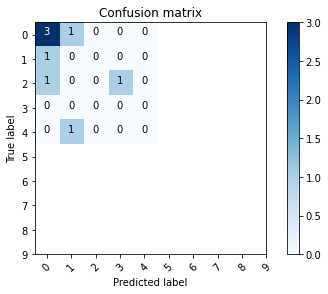

In [1596]:
clf.fit(X_train, y_train)
#p_train = clf.predict(X_train)
p_test = clf.predict(X_test)

# Plot confusion matrix
from sklearn.metrics import confusion_matrix
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    #print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()


cm = confusion_matrix(y_test, p_test)
plot_confusion_matrix(cm, list(range(10)))

## 4. Results and Discussion

### 4.1 Results

The best locations for potentially opening a new store is given by the locations with a predicted label value greater than the actual label value. As a result, two locations met the requirements.

In [1598]:
test_data[p_test>y_test]

,Starbucks_count,BoroCT2010,ATM,Accessories Store,Acupuncturist,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,Airport Tram,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Apres Ski Bar,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Baggage Locker,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Car Wash,Caribbean Restaurant,Carpet Store,Casino,Castle,Caucasian Restaurant,Cemetery,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cruise Ship,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Emergency Room,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Rink,Home Service,Hong Kong Restaurant,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Industrial Estate,Insurance Office,Intersection,Irish Pub,Island,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Kofte Place,Korean Restaurant,Kosher Restaurant,Lake,L

In [1603]:
test_locations[test_locations['BoroCT2010']==3055100]

,url,latitude,longitude,address,BoroCT2010
2,https://www.loopnet.com/Listing/277-279-Bedfor...,40.714229,-73.96128,"277-279 Bedford Ave, Brooklyn, NY 11211",3055100


In [1602]:
test_locations[test_locations['BoroCT2010']==1011203]

,url,latitude,longitude,address,BoroCT2010
1,https://www.loopnet.com/Listing/115-E-57th-St-...,40.761498,-73.969877,"115 E 57th St, New York, NY 10022",1011203


In [1606]:
# showing locations on a map
map3 = folium.Map(location=[40.77, -73.97], zoom_start=12)
folium.CircleMarker([40.714229,-73.96128], popup = 'Location 1',color = 'red', weight  = 0.5, fill = True, fill_color ='red',fill_opacity = 0.8).add_to(map3)
folium.CircleMarker([40.761498,-73.969877], popup = 'Location 2',color = 'red', weight  = 0.5, fill = True, fill_color ='red',fill_opacity = 0.8).add_to(map3)
map3

### 4.2 Discussion

The project achieved its goal using simple machine learning techniques and data science tools. However it does have a number of shortcomings for future improvements.

1. The problem we seek solution is not a standard classification problem, in the sense that even the data available is not considered absolutely *right*, because we can actually select any location to open more stores to change the data. So classification accuracy in the testing data is not as important as in the training data, since we need the inaccuracy to provide insights.

2. Sample size is limited compared to number of features available. 
   - This work only focus on extracting *venues* data that is close to a certain area while there are huge amounts of other types of data that can be easily incorporated such as demographic;
   - Even then, we have 538 features compared to only ~2,000 data points. This could potentially lead to overfitting so we tried using Principal Component Analysis(PCA)/Sparse PCA to reduce dimensionality, but the result is not ideal so it was dropped in the end.
   - Nonetheless, future work could be done on expanding the data size by potentially include data from more cities with similar charateristics as New York such as Chicago, London, etc.

3. The data is very sparse, so we could further explore other options in data processing and modeling to better fit such dataset. Potentially a model designed specifically for sparse data would do a better job.

4. Again, there are other excellent sources of data availble for improvement. From a more realistic perspective, only looking at Starbucks would not be enough. A collection of similar stores would be a good starting point for next steps. 

## 5. Conclusion

Our analysis process is as follows:

We extracted Starbucks locations throughout New York City, and combined it with New York City census data to allocate Starbucks locations into tracts. Then we pulled venues data from Foursquares API to characterize each tract by venues within them. Then we process the data we have, combined with Loopnet data to construct our training-validation-testing datasets. Finally we depoly a neural network model to predict each location's Starbucks store count, constrasting it with the actual store count to get new store potentials.

What we've learnt from the above analysis are:

1. Starbucks locations clusters towards dense areas such as Midtown and Downtown Manhattan, Downtown Brooklyn, etc. Not only that, potential new stores also tend to fall into these areas, indicating that the market is still yet to be saturated;

2. Even though the data size is not very large, a good model still provides excellent insight in predicting and evaluating business location selection.